In [1]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Camera Calibration

##  Distortion coefficients using the calibration chessboard

In [2]:
def detect_corners(img, nx=9, ny=6):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    return ret, corners

### Plot the chessboard corners

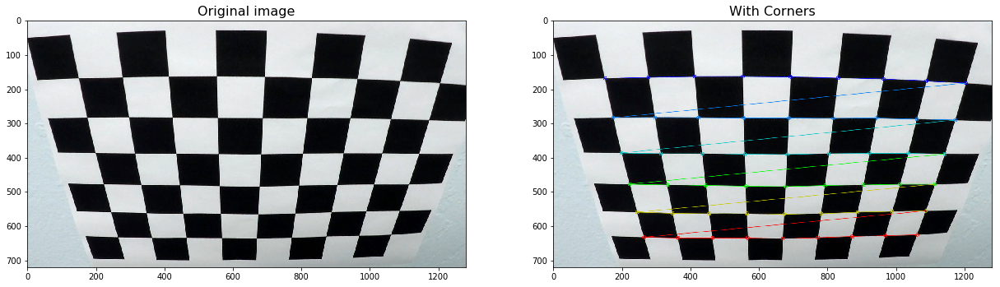

In [3]:
img = cv2.imread('camera_cal/calibration2.jpg')

# Find the chessboard corners
ret, corners = detect_corners(img)

write_name = 'camera_cal/corner_found_2.jpg'
cv2.imwrite(write_name, img)

# chessboard of size 9x6
cv2.drawChessboardCorners(img, (9,6), corners, ret)
def plt_both_images(img_1, title_1, img_2, title_2, name, save_img = False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(50,25))
    # f.set_figwidth(21)
    ax1.set_title(title_1, fontsize=16)
    ax1.imshow(img_1)
    ax2.set_title(title_2, fontsize=16)
    ax2.imshow(img_2, cmap='gray')
    if save_img:
        plt.savefig('writeup/output_'+ str(name)+'.png')
    
plt_both_images(cv2.cvtColor(mpimg.imread('camera_cal/calibration2.jpg'), cv2.COLOR_BGR2RGB), 'Original image', img, 'With Corners', 'chess_corners', save_img= True)


## Distortion correction

In [4]:
def distort_correction(img, mtx,dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

def camera_calibration_process(images, nx=9, ny=6):
    # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Step through the list and search for chessboard corners
    img = None
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        ret, corners = detect_corners(img)
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    # Camera calibration, given object points, image points, and the shape of the grayscale image
    if (len(objpoints) > 0):
        # Camera successfully calibrated.
        print("Camera Calibration Completed")
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    else:
        # Unable to calibrate the camera.
        print("Redo camera calibration.")
        ret, mtx, dist, rvecs, tvecs = (None, None, None, None, None)

    return ret, mtx, dist, rvecs, tvecs
    

## Calibration images

In [5]:
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

ret, mtx, dist, rvecs, tvecs = camera_calibration_process(images)

Camera Calibration Completed


## Distortion correction for chessboard

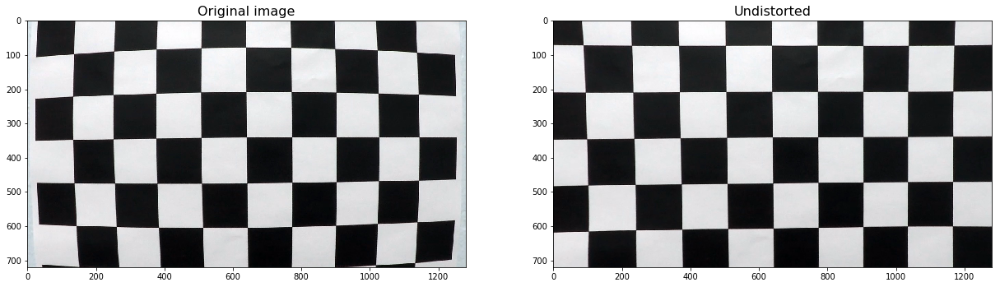

In [6]:
img = cv2.imread('camera_cal/calibration1.jpg')

undist = distort_correction(img, mtx, dist)

plt_both_images(img, 'Original image', undist, 'Undistorted', 'chess_undistorted', save_img=True)

# Pipeline (test images)

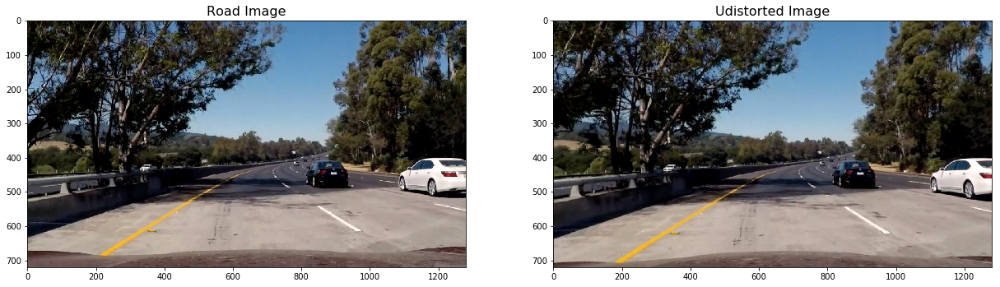

In [7]:
#Plot the image
img = cv2.imread('test_images/test5.jpg')
undist = distort_correction(img, mtx, dist)


plt_both_images(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), 'Road Image', cv2.cvtColor(undist, cv2.COLOR_BGR2RGB), 'Udistorted Image', 'road_undistorted', save_img= True)

## Color/gradient threshold

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    scaled_sobel = None
    
    # Sobel x
    if orient == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel) # Take the derivative in x
        abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
        
    # Sobel y
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) # Take the derivative in y
        abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))

    # Threshold x gradient
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    magnitude = np.sqrt(np.square(sobelx)+np.square(sobely))
    abs_magnitude = np.absolute(magnitude)
    scaled_magnitude = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    mag_binary = np.zeros_like(scaled_magnitude)
    mag_binary[(scaled_magnitude >= mag_thresh[0]) & (scaled_magnitude <= mag_thresh[1])] = 1
    
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    arctan = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(arctan)
    dir_binary[(arctan >= thresh[0]) & (arctan <= thresh[1])] = 1
    
    return dir_binary

def color_threshold(img,sthresh=(0,255),vthresh=(0,255)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > sthresh[0]) & (s_channel <= sthresh[1])] = 1
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel > vthresh[0]) & (v_channel <= vthresh[1])] = 1
    
    clr_binary = np.zeros_like(s_channel)
    clr_binary[(s_binary == 1) & (v_binary == 1)] = 1

    return clr_binary

def r_threshold(image, rmin, rmax):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    R = image[:,:,0]
    binary = np.zeros_like(R)
    binary[((R >= rmin) & (R <= rmax))] = 1
    return binary

def b_threshold(image, min, max):
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    Lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    b = Lab[:,:,2]
    binary = np.zeros_like(b)
    binary[(b >= min) & (b <= max)] = 1
    return binary

def l_threshold(image, min, max):
    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    L = luv[:,:,0]
    binary = np.zeros_like(L)
    binary[(L >= min) & (L <= max)] = 1
    return binary

### Plot the Binary Image

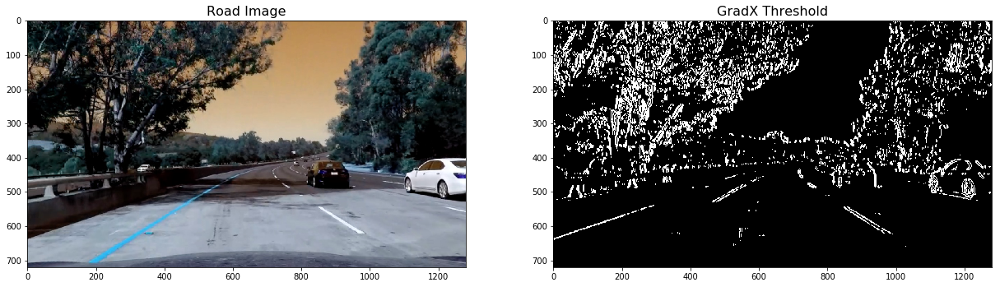

In [9]:
img = cv2.imread('test_images/test5.jpg')
    
img = distort_correction(img, mtx, dist)

# Choose a Sobel kernel size
ksize = 15 # Choose a larger odd number to smooth gradient measurements

gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(30, 150))
grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(30, 150))

# write_name = 'test_images/combined_binary_2.jpg'
# cv2.imwrite(write_name, combined_binary)

plt_both_images(img, 'Road Image', gradx, 'GradX Threshold', 'color_threshold')


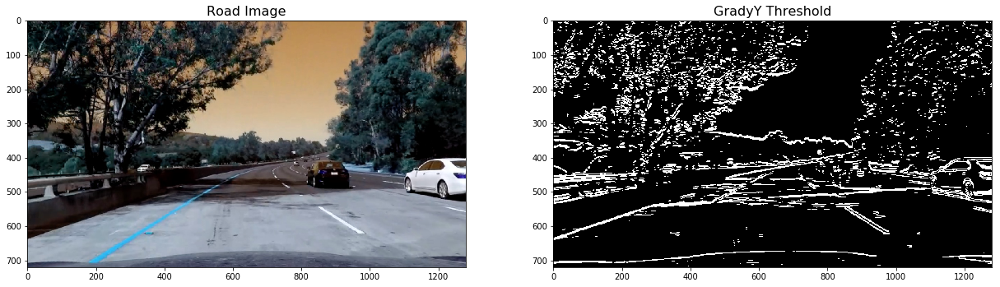

In [10]:
plt_both_images(img, 'Road Image', grady, 'GradyY Threshold', 'color_threshold')

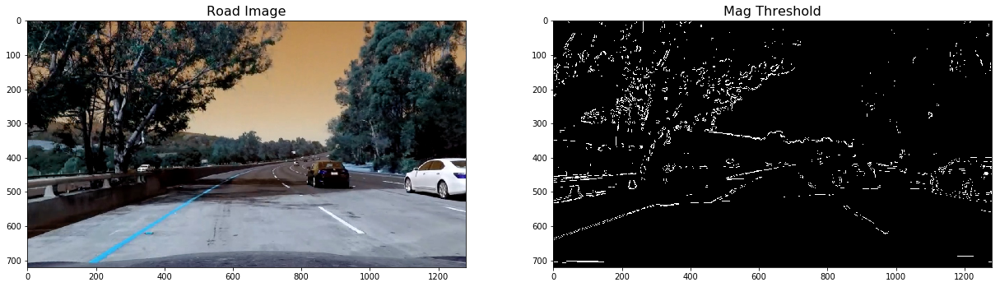

In [11]:
mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(70, 100))
plt_both_images(img, 'Road Image', mag_binary, 'Mag Threshold', 'color_threshold')

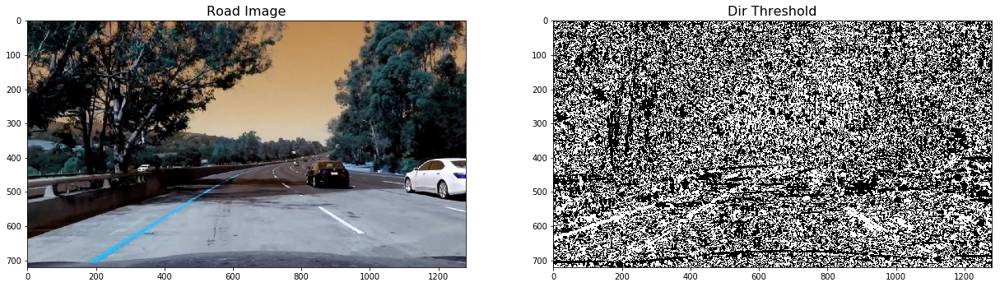

In [12]:
dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.4))
plt_both_images(img, 'Road Image', dir_binary, 'Dir Threshold', 'color_threshold')

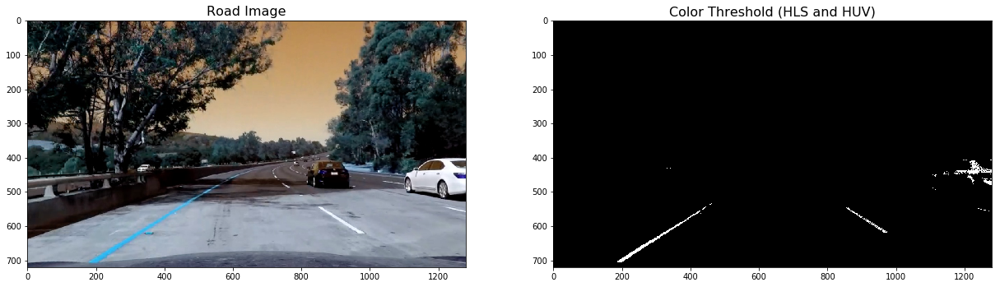

In [13]:
s_binary = color_threshold(img,sthresh=(190,255),vthresh=(100,255))
plt_both_images(img, 'Road Image', s_binary, 'Color Threshold (HLS and HUV)', 'color_threshold')

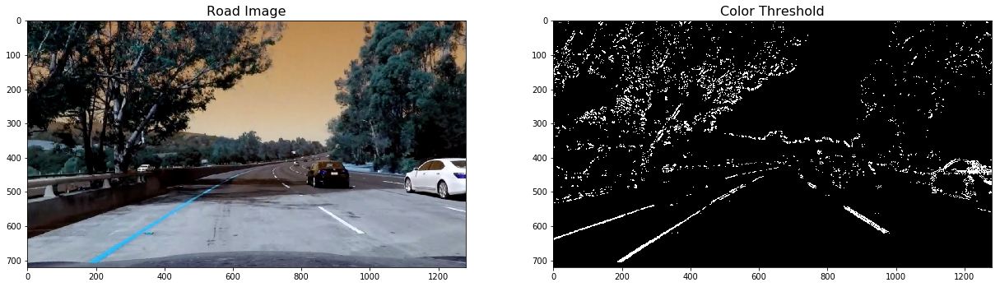

In [14]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (s_binary == 1)] = 1
plt_both_images(img, 'Road Image', combined, 'Color Threshold', 'color_threshold', save_img=True)

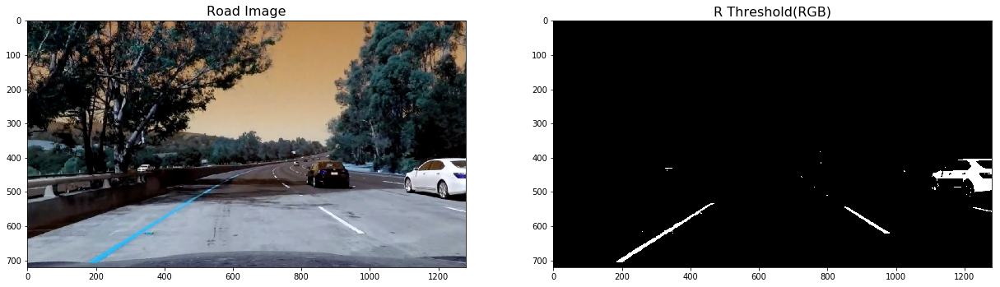

In [15]:
r_binary = r_threshold(img, 220, 255)
plt_both_images(img, 'Road Image', r_binary, 'R Threshold(RGB)', 'color_threshold')



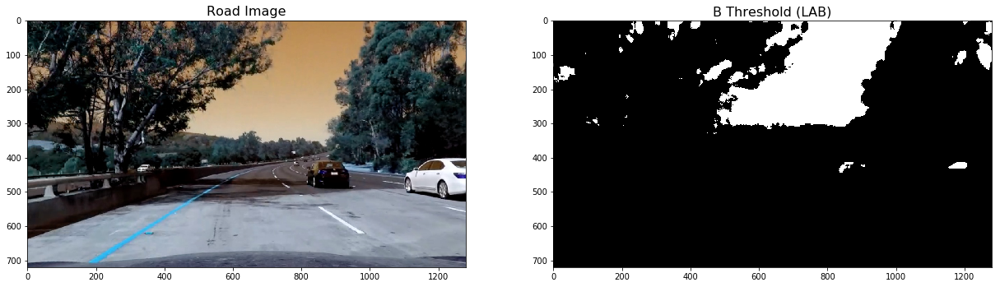

In [16]:
b_binary = b_threshold(img, 145, 200)
plt_both_images(img, 'Road Image', b_binary, 'B Threshold (LAB)', 'color_threshold')

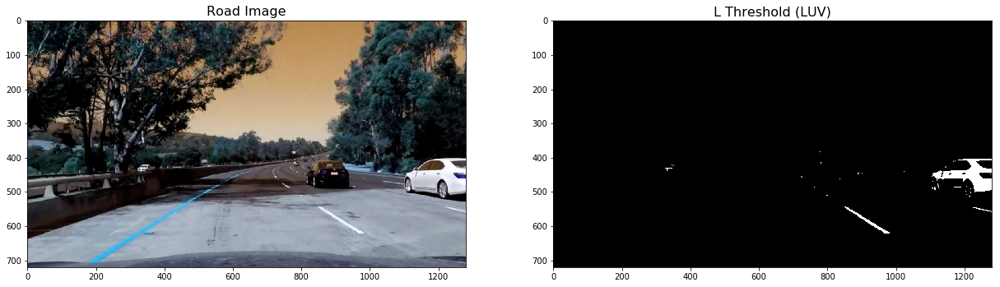

In [17]:
l_binary = l_threshold(img, 215, 255)
plt_both_images(img, 'Road Image', l_binary, 'L Threshold (LUV)', 'color_threshold')

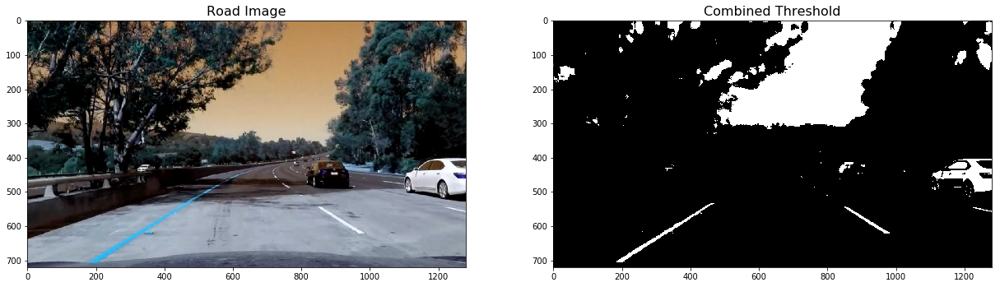

In [18]:
combined_binary = np.zeros_like(combined)
    
combined_binary[((b_binary == 1) | (l_binary == 1) | (r_binary == 1))] = 1
plt_both_images(img, 'Road Image', combined_binary, 'Combined Threshold', 'combined_threshold', save_img=True)

## Perspective transform

In [19]:
def perspective_transform(img,src=None, dst=None):
    img_size = (img.shape[1], img.shape[0])
    
    leftupperpoint  = [568,470]
    rightupperpoint = [717,470]
    leftlowerpoint  = [260,680]
    rightlowerpoint = [1043,680]

    src = np.float32([leftupperpoint, leftlowerpoint, rightupperpoint, rightlowerpoint])
    dst = np.float32([[200,0], [200,680], [1000,0], [1000,680]])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst,src)
    warped = cv2.warpPerspective(img, M, img_size,flags=cv2.INTER_NEAREST)
    
    return warped, M, Minv

# def visualize_transorm_image(combined_binary, warped):
#     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     f.tight_layout()
#     ax1.imshow(combined_binary, cmap='gray')
#     ax1.set_title('Original Image', fontsize=50)
#     ax2.imshow(warped,cmap='gray')
#     ax2.set_title('Warped Image', fontsize=50)

### Plot the Warped image

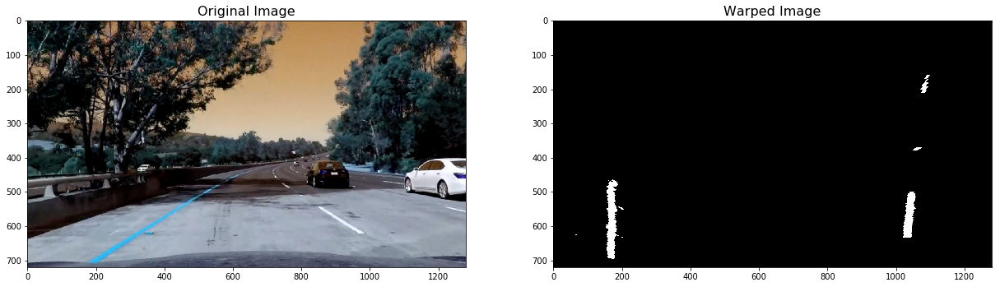

In [20]:
warped, M, Minv = perspective_transform(combined_binary, src=None, dst=None)

plt_both_images(img, 'Original Image', warped, 'Warped Image', 'road_warped', save_img= True)
# visualize_transorm_image(img, warped)



### Plot the histogram

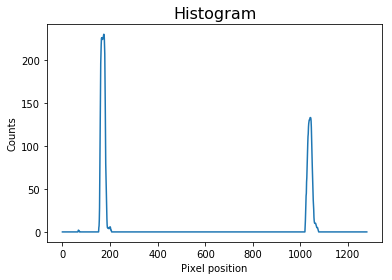

In [21]:
def get_histogram(img):
    return np.sum(img[img.shape[0]//2:, :], axis=0)

# Run de function over the combined warped image
combined_warped = perspective_transform(combined_binary)[0]
histogram = get_histogram(combined_warped)



# Plot the results
plt.title('Histogram', fontsize=16)
plt.xlabel('Pixel position')
plt.ylabel('Counts')
plt.plot(histogram)
plt.savefig('writeup/output_histogram.png')

## Measurement of lane lines

In [22]:
def find_lane_pixels(img, return_img=False):
     # Take a histogram of the bottom half of the image
    histogram = get_histogram(img)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
   

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100

    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if return_img:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
            
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    if return_img:
        ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])

        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    
    
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Draw left and right lines
        for index in range(img.shape[0]):
            cv2.circle(out_img, (int(left_fitx[index]), int(ploty[index])), 3, (255,255,0))
            cv2.circle(out_img, (int(right_fitx[index]), int(ploty[index])), 3, (255,255,0))
            
        return left_fit, right_fit,out_img.astype(np.uint8)

    return left_fit, right_fit

In [23]:
left_fit, right_fit = find_lane_pixels(combined_warped)

In [24]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    
    # Fit a second order polynomial to each
    if len(leftx) == 0:
        left_fit_new =[]
    else:
        left_fit_new = np.polyfit(lefty, leftx, 2)
    
    if len(rightx) == 0:
        right_fit_new =[]
    else:
        right_fit_new = np.polyfit(righty, rightx, 2)
     
    return left_fit_new, right_fit_new
    

##  Finding the lines

In [25]:
def search_around_poly(binary_warped, left_fit, right_fit, return_img=False):
#     print("search_around_poly")
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    margin = 50
    
    ### Set the area of search based on activated x-values ###

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
     # Fit new polynomials
    left_fitx, right_fitx = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    if return_img:
         # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
        return left_fitx, right_fitx, out_img.astype(np.uint8)
    
    return left_fitx, right_fitx

In [26]:

left_fitx, right_fitx,out_img = search_around_poly(combined_warped, left_fit, right_fit, return_img=True)

# # View your output
# plt_both_images(warped, 'Warped image', out_img, 'Lane lines detected', 'lane_line_prior')

In [27]:
# Identify the lane boundaries
def lane_curvature(binary_warped,left_fit, right_fit):
    
    ploty = np.linspace(0, 719, 720 )
   
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curvature =  ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    right_curvature = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[1]*y_eval)**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[1]*y_eval)**2 + right_fit[1]*y_eval + right_fit[2]
    
    # Lane center as mid of left and right lane bottom                        
    lane_center = (left_lane_bottom + right_lane_bottom)//2.
    center_image = 640
    center = (lane_center - center_image)*xm_per_pix #Convert to meters
    position = "left" if center < 0 else "right"
    center = "Vehicle is {:.2f}m {}".format(center, position)
    
    # Now our radius of curvature is in meters
    return left_curvature, right_curvature, center


In [28]:
left_curvature, right_curvature, center = lane_curvature(combined_warped, left_fit, right_fit)

# Print the results
print('Left line curvature:', left_curvature, 'm')
print('Right line curvature:', right_curvature, 'm')
print('Car offset from center:', center, 'm.')

Left line curvature: 1672.88475761 m
Right line curvature: 4180.2885266 m
Car offset from center: Vehicle is 44.33m right m.


In [29]:

def draw_over_lane(img, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, plt_img=False):
     
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
   
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    
    Minv = np.linalg.inv(M)
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    cv2.putText(result, 'Left curvature: {:.0f} m'.format(left_curvature), (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Right curvature: {:.0f} m'.format(right_curvature), (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, '{}'.format(center), (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    if plt_img:
        fig, ax = plt.subplots(figsize=(20, 10))
        ax.imshow(result)


    # Return the 8-bit mask
    return result

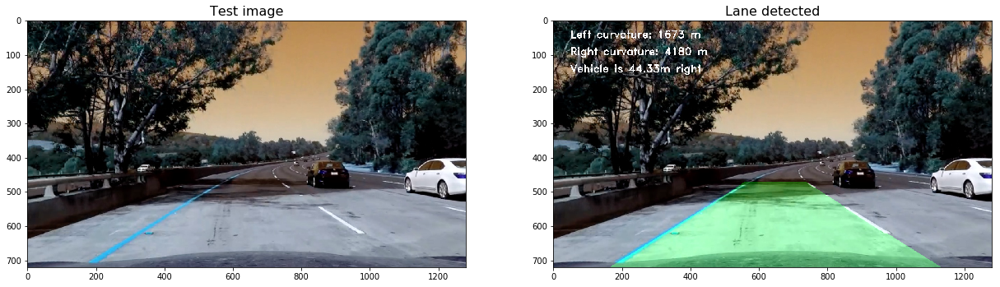

In [30]:
img_lane = draw_over_lane(img, combined_warped, left_fit, right_fit, M, left_curvature, right_curvature, center, plt_img = False)


# Plot the results
plt_both_images(img, 'Test image', img_lane, 'Lane detected','lane_plot', save_img= True)

In [31]:
def is_lane_valid(left_fit, right_fit):
    
    #Check if left and right fit returned a value
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False

    else:
        #Check distance b/w lines
        ploty = np.linspace(0, 20, num=10 )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        delta_lines = np.mean(right_fitx - left_fitx)
        if delta_lines >= 150 and delta_lines <=430: 
            status = True
        else:
            status = False
        
        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)
        left = 2*left_fit[0]*360+left_fit[1]
        right = 2*right_fit[0]*360+right_fit[1]
        delta_slope_mid =  np.abs(left-right)
        
        #Check if lines are parallel at the middle
        if delta_slope_mid <= 0.1:
#             print("Status = True")
            status = True
        else:
#             print("Status = False")
            status = False
            
    return status

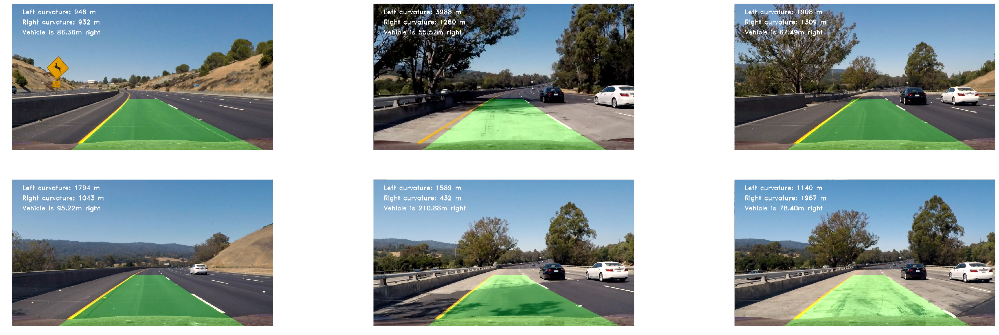

In [32]:
# Define a class to receive the characteristics of each line detection
class Lane():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.counter = 0
        self.reset_counter = 0
        
lane = Lane()

def find_lanes(img):
    
    img = cv2.undistort(img, mtx, dist, None, mtx)
    ksize = 15
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20, 100))

    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.4))
    s_binary = color_threshold(img,sthresh=(140,255),vthresh=(100,255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    
    r_binary = r_threshold(img, 220, 255)
    b_binary = b_threshold(img, 145, 200)
    l_binary = l_threshold(img, 215, 255)
    combined_binary = np.zeros_like(combined)

    combined_binary[((b_binary == 1) | (l_binary == 1) | (r_binary == 1))] = 1
    
    combined_warped, M, Minv = perspective_transform(combined_binary)

    

    if lane.counter == 0:
        lane.left_fit, lane.right_fit = find_lane_pixels(combined_warped)
    else:
        lane.left_fit, lane.right_fit = search_around_poly(combined_warped, lane.left_fit, lane.right_fit)
    
    #Sanity check
    status = is_lane_valid(lane.left_fit, lane.right_fit)
    
    if status == True: 
        lane.last_left, lane.last_right = lane.left_fit, lane.right_fit        
        lane.counter += 1
        lane.reset_counter = 0
    else:   
        #Reset
        lane.last_left, lane.last_right = lane.left_fit, lane.right_fit
        if lane.reset_counter > 4:
            lane.left_fit, lane.right_fit = find_lane_pixels(combined_warped)
            lane.reset_counter = 0
        else:
            lane.left_fit, lane.right_fit = lane.last_left, lane.last_right
            
        lane.reset_counter += 1
    
    return combined_warped, lane.left_fit, lane.right_fit, M

def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_lanes(img)

    # Warp the detected lane boundaries back onto the original image.
    left_curvature, right_curvature, center  = lane_curvature(warped_img, left_fit, right_fit)

            
    # Add metrics to the output img
    out_image = draw_over_lane(img, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center,plt_img = False)
     
    return out_image

images = glob.glob('test_images/test*.jpg')

plt.figure(figsize=(50, 25))


for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = pipeline(img, True)
    plt.subplot(3, 3, idx+1)
    plt.imshow(result)
    plt.axis('off')
plt.savefig('writeup/output_final.png')

In [33]:
output_video = 'output_video.mp4'
input_video = 'project_video.mp4'

lane = Lane()
def process_image(img):
    return pipeline(img)

clip1 = VideoFileClip(input_video)

white_clip = clip1.fl_image(process_image)

%time white_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████▉| 1260/1261 [14:09<00:00,  1.47it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 

CPU times: user 11min 51s, sys: 2.24 s, total: 11min 53s
Wall time: 14min 12s


## Embed the output video

In [34]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('output_video.mp4'))